# MareFEst : Mare Fertility Estimation

The following notebook illustrates the workflow of the MareFEst project within the context of the final degree project of Facultad de Ingenieria (UdelaR). <!-- Poner nuestros nombres o especificar de los autores. -->

The workflow pipeline consists of: 
<!-- the following steps -->
<!-- (workflow y pipeline son sinónimos poner un solo término)  -->

   1. Generate model inferences across the entire WSI (nuclei, glands, and fibrosis).
   2. Align all the masks to be processed and divide them into patches.
   3. Process the resulting masks patches before obtaining information about them.
   <!-- 3. Posprocess mask patches to refine segmentation. -->
   <!-- 4. Extract information from mask patches./ Extract information from the entire WSI-->
   4. Extract information from images.

In [22]:
import os
import cv2
import json
import sys
import random
import joblib
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import plotly.graph_objects as go
seed_value = 46
random.seed(seed_value)

sys.path.append('src/')

from segmentation.colon_epithelium_segmentation_with_postprocessing import epithelium_segmentation_wsi
from segmentation.gland_segmentation_with_postprocessing import gland_segmentation_wsi
from segmentation.nuclei_segmentation import nuclei_segmentation_wsi
from utils.extract_all_patches import extract_all_patches, init_folder_dict, get_model_type_from_path
from preprocessing.mask_preprocess import mask_preprocessing
from utils.plot_utils import show_masks
from posprocessing.glands_posprocessing import GlandsPosprocessing
from posprocessing.feature_extraction import nuclei_feature_extraction
from posprocessing.kmeans_inference import normalize_features
from posprocessing.nuclei_high_circularity import nuclei_high_circularity
from posprocessing.kmeans_inference import plot_results_kmeans

In [5]:
# Initialize
wsi_path = 'data/Lady.svs' 

## 1. Generate inferences

The following functions take as input the path of a test Whole Slide Image (WSI), perform inference with all segmentation models, display the results, and save them into tiff files.
<!-- Me queda la duda si mostró la inferencia o no. Yo lo dejé corriendo y me fui. -->
<!-- Hay que subir la WSI, yo usé una que ya tenía, no estaba en el repo.-->
<!-- También creo que hay que borrar unos archivos que están en el repo en la carpeta data -->

<!-- Me parce que esto ya no es así y habría que sacarlo -->
For didactic purposes, we will load previously generated .tiff files for the gland and nucleus models. The .tiff files can also be generated by running the scripts:

* `colon_epithelium_segmentation_with_postprocessing.py` or `gland-segmentation-with-postprocessing.py`
    
* `nuclei_segmentation.py`

Depending on the purpose, two different models can be run for the glands category. If you want to assess density, the **colon epithelium model** is a better option, while if you want to classify or measure the shape of the glands, the model trained with GlaS (**glands model**) is recommended.

In [6]:
# Run this code to make inference 

# Select a glands model
glands_model =  'colon_epithelium_tiffs' # or 'gland_tiffs'

if glands_model == 'gland_tiffs':
   gland_segmentation_wsi(wsi_path)
else :
   epithelium_segmentation_wsi(wsi_path)

nuclei_segmentation_wsi(wsi_path)

## 2. Extract aligned patches

The next step is to align the Whole Slide Image (WSI) and the inferences to the same scale and crop them into patches. The magnification level (`level`), crop size, and other parameters are configured from `src/config.json` file.
<!-- Capaz aclarar que en sí no es el magnification level lo que se configura sino el level de openslide -->
<!-- Se puede poner algo así como The resolution level -->

After running `extract_all_patches()` a `report.json` file is saved in the folder with information about the patch extraction configuration along with information about the WSI.
<!-- Aclarar en que folder se guarda -->
<!-- Capaz combiene poner la estructura de carpetas que se crea al correr el nb -->

*Note: Ignore the warnings*
<!-- Sabemos a que se deben? O buscar para que no se impriman? -->

<!-- Hay una línea en el código de abajo que no entendí del todo que se refiere: # If True saves a patches with mask .  -->

In [8]:
# Create a dictionary to hold the imported parameters
config = {}
config['wsi_name'] = os.path.basename(wsi_path).split('.')[0]


# Path to .tiff inferences
nuclei_tiff_path = f"nuclei_tiffs/{config['wsi_name']}.tiff"
fibrosis_tiffs_path = f"fibrosis_tiffs/{config['wsi_name']}.tiff"
epithelium_tiff_path = f"{glands_model}/{config['wsi_name']}.tiff"

# If the used model is the epithelium or gland model
config['glands_model_type'] = get_model_type_from_path(epithelium_tiff_path)
config['output_dir'] = init_folder_dict(None, config)

# Remove patches with background
config['bgremoved'] = True

# If True saves a patches with mask . 
# WARNING: Activating this functionality can take a long time
config['patch_visualization'] = False

# Load the configuration from the JSON file
with open('src/config.json', 'r') as config_file:
    params = json.load(config_file)
    
for key in params.keys():
    config[key] = params[key]

if not os.path.exists(fibrosis_tiffs_path):
    fibrosis_tiffs_path = None

extract_all_patches(wsi_path,config, nuclei_tiff_path, epithelium_tiff_path,fibrosis_tiffs_path )

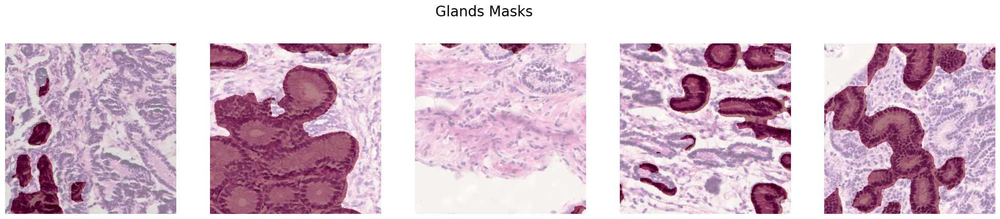

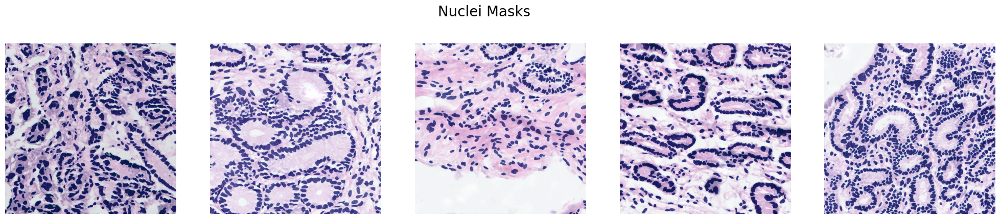

In [13]:
# Show some inferences
samples = 5
list_filenames = os.listdir(os.path.join(config['output_dir'], 'patches'))
random_items = random.sample(list_filenames, samples)

show_masks(random_items, config['output_dir'], cmap = 'Reds', channel = config['channel_glands'], title = 'Glands Masks')
show_masks(random_items, config['output_dir'], cmap = 'Blues', channel = config['channel_nuclei'], title = 'Nuclei Masks')
#show_masks(random_items, config['output_dir'], cmap = 'Greens', channel = config['channel_fibrosis'], title = 'Fibrosis Masks')

## 3. Masks preprocessing

To refine the gland and epithelium masks, certain filters are applied. In the case of the gland mask, inferences corresponding to the contours of the WSI are removed, and the masks with holes are filled in. 
<!-- En vez de la frase In the case of .... yo pondría: Luminal epithelium is removed from the segmentation and masks with holes are filled in. -->

For nuclei masks the preprocess starts by removing nuclei instances that overlap with detected glands. The remaining nuclei instances are dilated and the connectected components with large areas are also removed, assuming that they correspond to gland epithelium nuclei.

100%|███████████████████████████████████████| 1670/1670 [01:55<00:00, 14.50it/s]


Preprocessing finished


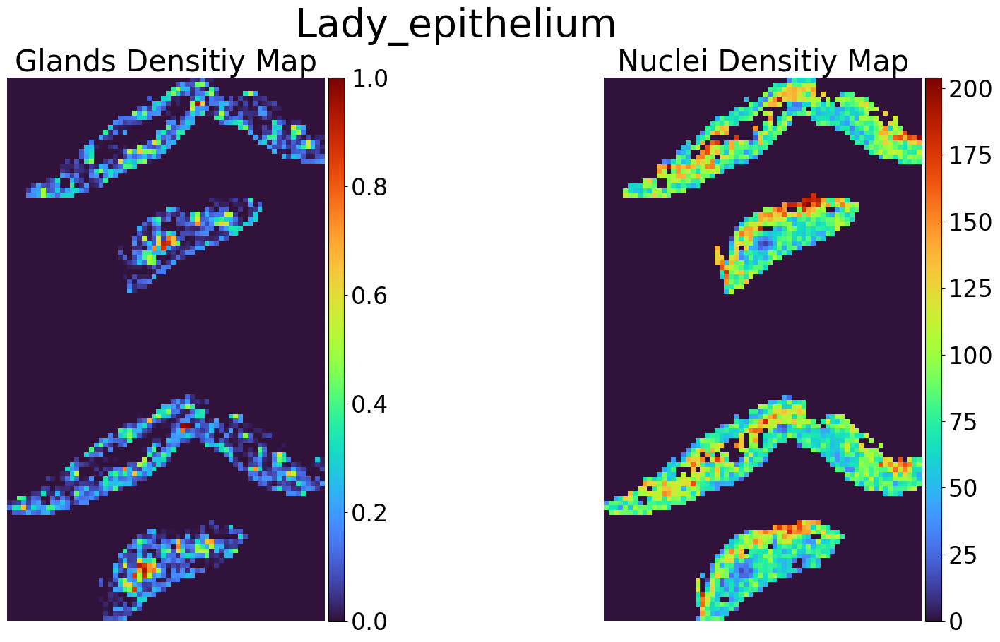

In [15]:
mask_preprocessing(src_folder = config['output_dir'],new_folder = 'new_masks')

In the image, density maps for segmentation inferences are shown. In the case of fibrosis and glands, the number of segmented pixels over the total pixels per image is reported, while for nuclei, the number of instances per image is counted.

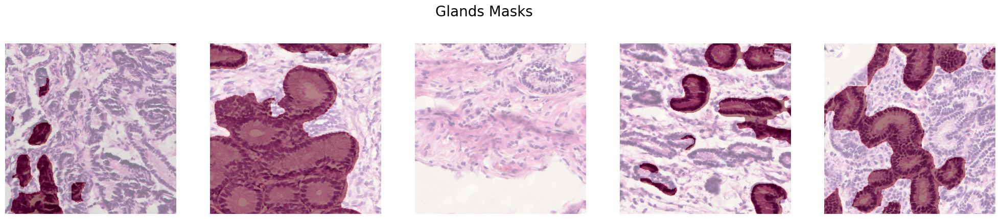

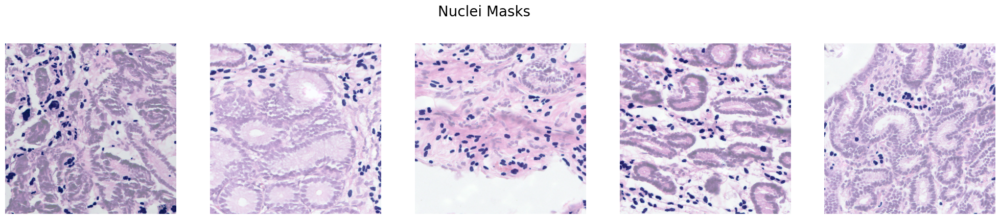

In [16]:
# See post-processed masks
show_masks(random_items, config['output_dir'], cmap = 'Reds', channel = config['channel_glands'], title = 'Glands Masks')
show_masks(random_items, config['output_dir'], cmap = 'Blues', channel = config['channel_nuclei'], title = 'Nuclei Masks')

## 4. Extract information

### 4.1 Glands information
For each image, gland instances are separated, and the relative area of each gland is measured. The `extract_features` function generates a DataFrame that contains information about each gland, identifying it uniquely across the entire WSI and within the image that belongs.

<!-- Si se cambió la función que calcula el área, poner que también se puede obtener el área absoluta. -->

In [17]:
glands_posprocessing = GlandsPosprocessing(path_to_folder = config['output_dir'])
glands_posprocessing.extract_features()
glands_posprocessing.glands_data

100%|███████████████████████████████████████| 1670/1670 [00:31<00:00, 53.34it/s]


,patch_loc,patch_gland_ind,relative_area
gland_id,,,
0,100352_25600,4,0.031688
1,76800_41984,1,0.010514
2,76800_41984,2,0.005365
3,76800_41984,3,0.045897
4,76800_41984,8,0.013104
...,...,...,...
4138,31744_45056,6,0.005085
4139,31744_45056,13,0.010262
4140,98304_37888,1,0.073202


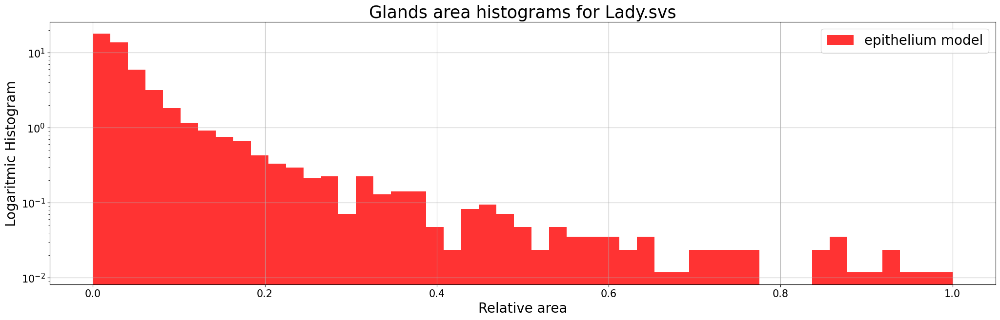

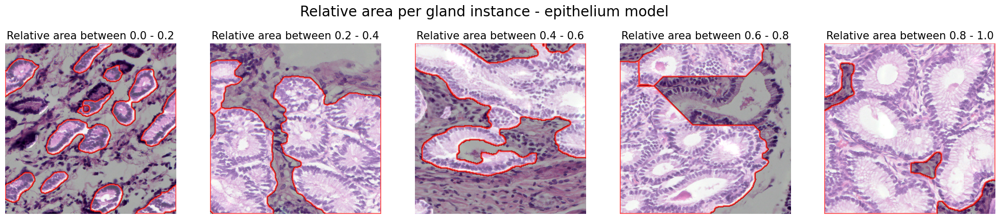

In [18]:
glands_posprocessing.plot_results()

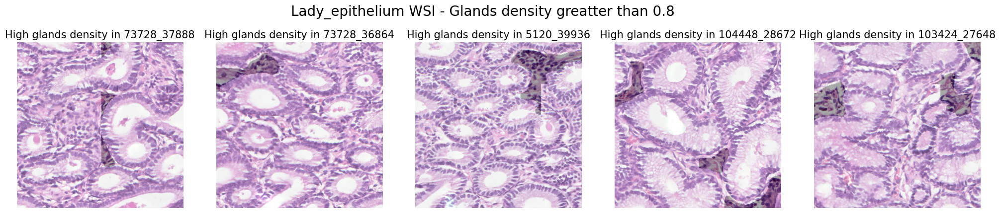

In [19]:
glands_posprocessing.show_glands_density_greatter_than(relative_area = 0.8)

#### Compare with others WSIs

We can run these steps for other WSIs and compare the results. Next, we will retrieve data from another already processed WSI. 
<!-- Vamos a cargar patches y eso de una WSI? Capaz conviene decirle al usuario como hacer para correr todo lo anterior para otra WSI sin pisar esto, o dejarlo todo pronto y que sea corre esto  -->

*NOTE: For the comparison to make sense, we should choose the same gland segmentation model.*

<!-- No corrí lo de abajo -->

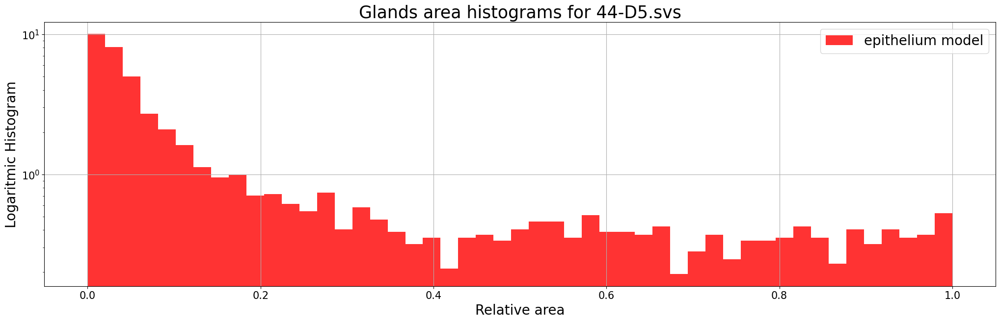

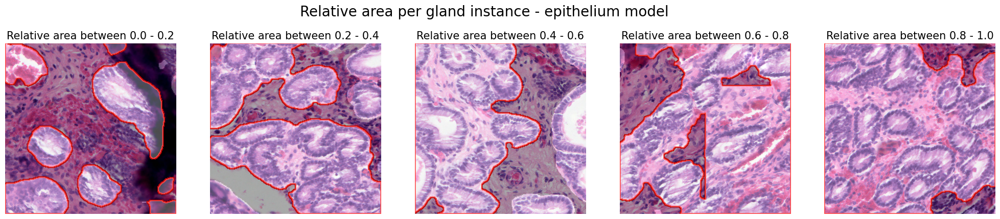

In [28]:
other_wsi_name = 'data/44-D5' +'_'+config['glands_model_type']
other_glands_posprocessing = GlandsPosprocessing(path_to_folder = other_wsi_name)
other_glands_posprocessing.extract_features()
other_glands_posprocessing.plot_results()

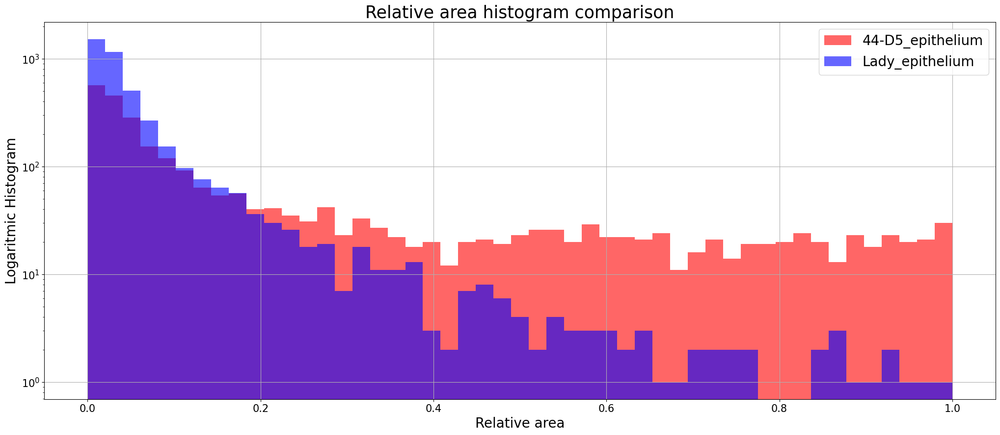

In [29]:
# See comparation
glands_posprocessing.compare_with(other_glands_posprocessing)

### 4.2 Nuclei information